<a href="https://colab.research.google.com/github/antonellagambarte/vision-por-computadoras-II/blob/main/eda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import gdown
import zipfile
import os
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, UnidentifiedImageError
import random
import cv2
import numpy as np
import hashlib

### **Carga del dataset**

In [2]:
url = "https://drive.google.com/uc?id=1EAe3-k6Mj6UBd3uEA3gtotnSxtIIEkri"
output = "archivo.zip"

gdown.download(url, output, quiet=False, fuzzy=True)

destino = "datos_zip"
os.makedirs(destino, exist_ok=True)
with zipfile.ZipFile(output, 'r') as zip_ref:
    zip_ref.extractall(destino)

print("Archivo extraído correctamente en :", destino)

Downloading...
From (original): https://drive.google.com/uc?id=1EAe3-k6Mj6UBd3uEA3gtotnSxtIIEkri
From (redirected): https://drive.google.com/uc?id=1EAe3-k6Mj6UBd3uEA3gtotnSxtIIEkri&confirm=t&uuid=90255e3c-075a-467e-87ed-380234f410e1
To: /content/archivo.zip
100%|██████████| 2.19G/2.19G [00:12<00:00, 170MB/s] 


Archivo extraído correctamente en : datos_zip


Analizando las carpetas del dataset, podemos ver que tienen 3 carpetas: color, grayscale segmeted.

En cada carpeta, están separadas las imagenes en carpetas cuyo nombre se componen de la siguiente manera:

planta__enfermedad/healthy, esto último según se trate de imagenes de plantas sanas o tienen una enfermedad en particular.

In [3]:
data_dir = "datos_zip/plantvillage dataset"

# Existen 3 carpetas en el dataset
tipos = ["color", "grayscale", "segmented"]

all_data = []

for tipo in tipos:
    tipo_dir = os.path.join(data_dir, tipo)
    for label in os.listdir(tipo_dir):
        folder = os.path.join(tipo_dir, label)
        if os.path.isdir(folder):
            for img_name in os.listdir(folder):
                img_path = os.path.join(folder, img_name)
                # Se guarda el tipo (color, segmented,grayscale), el label (ej. Apple_Apple_scab) y el path a la imagen
                all_data.append({"tipo": tipo, "label": label, "path": img_path})


In [4]:
df = pd.DataFrame(all_data)
print(f"Total de imágenes: {len(df)}")
print(f"Número de clases: {df['label'].nunique()}")


Total de imágenes: 162916
Número de clases: 38


In [5]:
df.head()

,tipo,label,path
0,color,Potato___healthy,datos_zip/plantvillage dataset/color/Potato___...
1,color,Potato___healthy,datos_zip/plantvillage dataset/color/Potato___...
2,color,Potato___healthy,datos_zip/plantvillage dataset/color/Potato___...
3,color,Potato___healthy,datos_zip/plantvillage dataset/color/Potato___...
4,color,Potato___healthy,datos_zip/plantvillage dataset/color/Potato___...


Cada carpeta existen 38 clases.

In [6]:
df['tipo'].value_counts()

,count
tipo,
segmented,54306
color,54305
grayscale,54305


### **Utils**

In [7]:
def get_color_proportions(image_path):
    """
    Calcula proporción de amarillo y verde.
    Retorna: (yellow_proportion, green_proportion)
    """
    try:
        img = cv2.imread(image_path)
        if img is None: return 0.0, 0.0

        hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

        # Tus rangos originales
        lower_yellow = np.array([20, 100, 100])
        upper_yellow = np.array([40, 255, 255])
        lower_green = np.array([40, 40, 40])
        upper_green = np.array([80, 255, 255])

        mask_yellow = cv2.inRange(hsv, lower_yellow, upper_yellow)
        mask_green = cv2.inRange(hsv, lower_green, upper_green)

        non_black_pixels_mask = (img[:,:,0] != 0) | (img[:,:,1] != 0) | (img[:,:,2] != 0)
        total = np.sum(non_black_pixels_mask)

        if total == 0: return 0.0, 0.0

        y_prop = np.sum(mask_yellow[non_black_pixels_mask] > 0) / total
        g_prop = np.sum(mask_green[non_black_pixels_mask] > 0) / total
        return y_prop, g_prop
    except:
        return 0.0, 0.0

def get_rgb_stats(image_path):
    """
    Reemplaza a plot_rgb_distribution. Retorna medias RGB.
    """
    try:
        img = Image.open(image_path).convert("RGB")
        arr = np.array(img)
        # Media de cada canal
        return np.mean(arr[:,:,0]), np.mean(arr[:,:,1]), np.mean(arr[:,:,2])
    except:
        return 0.0, 0.0, 0.0

def get_red_brown_stats(image_path):
    """
    Reemplaza a plot_red_brown_distribution. Retorna proporción de rojo y marrón.
    """
    try:
        img = Image.open(image_path).convert("RGB")
        arr = np.array(img)
        hsv = cv2.cvtColor(arr, cv2.COLOR_RGB2HSV)

        # Tus rangos originales
        lower_red1 = np.array([0, 80, 50])
        upper_red1 = np.array([10, 255, 255])
        lower_red2 = np.array([170, 80, 50])
        upper_red2 = np.array([180, 255, 255])
        lower_brown = np.array([10, 80, 20])
        upper_brown = np.array([25, 255, 200])

        mask_red = cv2.bitwise_or(cv2.inRange(hsv, lower_red1, upper_red1),
                                  cv2.inRange(hsv, lower_red2, upper_red2))
        mask_brown = cv2.inRange(hsv, lower_brown, upper_brown)

        # Calculamos sobre el total de la imagen (o podrías filtrar fondo negro si quisieras)
        total = arr.shape[0] * arr.shape[1]
        return np.count_nonzero(mask_red)/total, np.count_nonzero(mask_brown)/total
    except:
        return 0.0, 0.0

def get_general_stats(image_path):
    """
    Reemplaza a analyze_image_stats. Retorna brillo, contraste y saturación.
    """
    try:
        img = Image.open(image_path).convert("RGB")
        hsv = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2HSV)
        s, v = hsv[:,:,1], hsv[:,:,2]
        return np.mean(v), np.std(v), np.mean(s)
    except:
        return 0.0, 0.0, 0.0

In [8]:
def plot_rgb_distribution(image_path, title="Distribución de Canales RGB"):
    """
    Carga una imagen, separa sus canales RGB y genera histogramas para la intensidad de cada canal.

    Args:
        image_path (str): Ruta al archivo de imagen.
        title (str): Título para el gráfico de los histogramas.
    """
    if image_path is None:
        print("No se puede procesar la imagen: la ruta es nula.")
        return

    try:
        img = Image.open(image_path).convert("RGB") # Asegurarse de que la imagen sea RGB
        img_array = np.array(img)

        # Separar canales RGB
        r_channel = img_array[:, :, 0]
        g_channel = img_array[:, :, 1]
        b_channel = img_array[:, :, 2]

        # Crear histogramas
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        fig.suptitle(title, fontsize=16)

        axes[0].hist(r_channel.flatten(), bins=256, color='red', alpha=0.7)
        axes[0].set_title('Canal Rojo')
        axes[0].set_xlabel('Intensidad')
        axes[0].set_ylabel('Frecuencia')

        axes[1].hist(g_channel.flatten(), bins=256, color='green', alpha=0.7)
        axes[1].set_title('Canal Verde')
        axes[1].set_xlabel('Intensidad')
        axes[1].set_ylabel('Frecuencia')

        axes[2].hist(b_channel.flatten(), bins=256, color='blue', alpha=0.7)
        axes[2].set_title('Canal Azul')
        axes[2].set_xlabel('Intensidad')
        axes[2].set_ylabel('Frecuencia')

        plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Ajustar layout para título
        plt.show()

        # Mostrar la imagen
        plt.figure(figsize=(6, 6))
        plt.imshow(img)
        plt.title(f"Imagen de muestra: {image_path.split('/')[-1]}")
        plt.axis('off')
        plt.show()

    except FileNotFoundError:
        print(f"Error: La imagen no se encontró en la ruta: {image_path}")
    except Exception as e:
        print(f"Ocurrió un error al procesar la imagen: {e}")

In [9]:
def plot_green_yellow_distribution(image_path, title="Distribución de Colores Verde y Amarillo"):
    """
    Carga una imagen, identifica píxeles verdes y amarillos y genera histogramas
    que representan su distribución de intensidad.

    Args:
        image_path (str): Ruta al archivo de imagen.
        title (str): Título para el gráfico de los histogramas.
    """
    if image_path is None:
        print("No se puede procesar la imagen: la ruta es nula.")
        return

    try:
        # --- Cargar imagen ---
        img = Image.open(image_path).convert("RGB")
        img_array = np.array(img)

        # Convertir a HSV para detectar mejor colores
        hsv = cv2.cvtColor(img_array, cv2.COLOR_RGB2HSV)

        # --- Definir rangos de color ---
        # Verde (aprox. 35° a 85° en H)
        lower_green = np.array([35, 50, 50])
        upper_green = np.array([85, 255, 255])

        # Amarillo (aprox. 20° a 35° en H)
        lower_yellow = np.array([20, 50, 50])
        upper_yellow = np.array([35, 255, 255])

        # --- Máscaras ---
        mask_green = cv2.inRange(hsv, lower_green, upper_green)
        mask_yellow = cv2.inRange(hsv, lower_yellow, upper_yellow)

        # --- Tono ----
        green_hue = hsv[:, :, 0][mask_green > 0]
        yellow_hue = hsv[:, :, 0][mask_yellow > 0]

        # --- Plot ---
        fig, axes = plt.subplots(1, 2, figsize=(12, 5))
        fig.suptitle(title, fontsize=16)


        axes[0].hist(green_hue, bins=50, color='green', alpha=0.7)
        axes[0].set_title('Distribución de Verde (H - Matiz)')
        axes[0].set_xlabel('Hue')
        axes[0].set_ylabel('Frecuencia')

        axes[1].hist(yellow_hue, bins=50, color='gold', alpha=0.7)
        axes[1].set_title('Distribución de Amarillo (H - Matiz)')
        axes[1].set_xlabel('Hue')
        axes[1].set_ylabel('Frecuencia')

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

        # Mostrar imagen original con los píxeles verdes y amarillos resaltados
        highlighted = img_array.copy()
        highlighted[mask_green > 0] = [0, 255, 0]
        highlighted[mask_yellow > 0] = [255, 255, 0]

        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        axes[0].imshow(img_array)
        axes[0].set_title("Imagen original")
        axes[0].axis('off')

        axes[1].imshow(highlighted)
        axes[1].set_title("Verde y Amarillo detectados")
        axes[1].axis('off')

        plt.tight_layout()
        plt.show()


    except FileNotFoundError:
        print(f"Error: La imagen no se encontró en la ruta: {image_path}")
    except Exception as e:
        print(f"Ocurrió un error al procesar la imagen: {e}")

In [10]:
def plot_red_brown_distribution(image_path, title="Distribución de Colores Rojo y Marrón"):
    """
    Carga una imagen, identifica píxeles rojos y marrones y genera histogramas
    que representan su distribución de intensidad.

    Args:
        image_path (str): Ruta al archivo de imagen.
        title (str): Título para el gráfico de los histogramas.
    """
    if image_path is None:
        print("No se puede procesar la imagen: la ruta es nula.")
        return

    try:
        # --- Cargar imagen ---
        img = Image.open(image_path).convert("RGB")
        img_array = np.array(img)

        # Convertir a HSV para detectar mejor colores
        hsv = cv2.cvtColor(img_array, cv2.COLOR_RGB2HSV)

        # --- Definir rangos de color ---
        # Rojo: está en los extremos del círculo de tono (H)
        lower_red1 = np.array([0, 80, 50])
        upper_red1 = np.array([10, 255, 255])
        lower_red2 = np.array([170, 80, 50])
        upper_red2 = np.array([180, 255, 255])

        # Marrón: valores entre rojo y naranja, pero con menor brillo (V)
        lower_brown = np.array([10, 80, 20])
        upper_brown = np.array([25, 255, 200])

        # --- Máscaras ---
        mask_red1 = cv2.inRange(hsv, lower_red1, upper_red1)
        mask_red2 = cv2.inRange(hsv, lower_red2, upper_red2)
        mask_red = cv2.bitwise_or(mask_red1, mask_red2)

        mask_brown = cv2.inRange(hsv, lower_brown, upper_brown)

        # --- Tono ----
        red_hue = hsv[:, :, 0][mask_red > 0]
        brown_hue = hsv[:, :, 0][mask_brown > 0]

        # --- Plot ---
        fig, axes = plt.subplots(1, 2, figsize=(12, 5))
        fig.suptitle(title, fontsize=16)

        axes[0].hist(red_hue, bins=50, color='red', alpha=0.7)
        axes[0].set_title('Distribución de Rojo (H - Matiz)')
        axes[0].set_xlabel('Hue')
        axes[0].set_ylabel('Frecuencia')

        axes[1].hist(brown_hue, bins=50, color='#8B4513', alpha=0.7)
        axes[1].set_title('Distribución de Marrón (H - Matiz)')
        axes[1].set_xlabel('Hue')
        axes[1].set_ylabel('Frecuencia')

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

        # --- Imagen resaltada ---
        highlighted = img_array.copy()
        highlighted[mask_red > 0] = [255, 0, 0]       # Rojo brillante
        highlighted[mask_brown > 0] = [139, 69, 19]   # Marrón

        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        axes[0].imshow(img_array)
        axes[0].set_title("Imagen original")
        axes[0].axis('off')

        axes[1].imshow(highlighted)
        axes[1].set_title("Rojos y Marrones detectados")
        axes[1].axis('off')

        plt.tight_layout()
        plt.show()

    except FileNotFoundError:
        print(f"Error: La imagen no se encontró en la ruta: {image_path}")
    except Exception as e:
        print(f"Ocurrió un error al procesar la imagen: {e}")

In [11]:
def analyze_image_stats(image_path, title="Estadísticas de brillo, contraste y saturación"):
    """
    Calcula brillo medio, contraste (std de intensidad) y saturación media de una imagen.
    Muestra histogramas de distribución de intensidad, saturación y brillo.

    Args:
        image_path (str): Ruta de la imagen.
        title (str): Título para los gráficos.
    """
    if image_path is None:
        print("No se puede procesar la imagen: la ruta es nula.")
        return

    try:
        # Cargar y convertir la imagen
        img = Image.open(image_path).convert("RGB")
        img_array = np.array(img)
        hsv = cv2.cvtColor(img_array, cv2.COLOR_RGB2HSV)

        # Extraer canales HSV
        h, s, v = hsv[:, :, 0], hsv[:, :, 1], hsv[:, :, 2]

        # Calcular estadísticas
        brillo_medio = np.mean(v)
        contraste = np.std(v)
        saturacion_media = np.mean(s)

        print(f"📊 Estadísticas para {image_path.split('/')[-1]}:")
        print(f"→ Brillo medio: {brillo_medio:.2f}")
        print(f"→ Contraste (desvío estándar): {contraste:.2f}")
        print(f"→ Saturación media: {saturacion_media:.2f}")

        # Graficar histogramas
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        fig.suptitle(title, fontsize=16)

        axes[0].hist(v.flatten(), bins=50, color='gray', alpha=0.7)
        axes[0].set_title('Distribución de Brillo (V)')
        axes[0].set_xlabel('Intensidad')
        axes[0].set_ylabel('Frecuencia')

        axes[1].hist(s.flatten(), bins=50, color='orange', alpha=0.7)
        axes[1].set_title('Distribución de Saturación (S)')
        axes[1].set_xlabel('Intensidad')
        axes[1].set_ylabel('Frecuencia')

        axes[2].hist(v.flatten(), bins=50, color='blue', alpha=0.3)
        axes[2].hist(s.flatten(), bins=50, color='red', alpha=0.3)
        axes[2].set_title('Brillo y Saturación superpuestos')
        axes[2].set_xlabel('Intensidad')
        axes[2].set_ylabel('Frecuencia')

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

        # Mostrar imagen original
        plt.figure(figsize=(5, 5))
        plt.imshow(img)
        plt.title(f"Imagen: {image_path.split('/')[-1]}")
        plt.axis('off')
        plt.show()

    except FileNotFoundError:
        print(f"Error: No se encontró la imagen en la ruta: {image_path}")
    except Exception as e:
        print(f"Ocurrió un error al procesar la imagen: {e}")


### **Revisamos si existen imágenes corruptas**

In [12]:
invalid = 0
for path in df['path']:
    try:
        with Image.open(path) as img:
            img.verify()  # verifica sin cargar toda la imagen
    except (UnidentifiedImageError, FileNotFoundError, OSError):
        invalid += 1

print(f"Imágenes corruptas: {invalid}")

Imágenes corruptas: 0


Separamos por tipo:

In [13]:
df_color = df[df['tipo'] == 'color']
df_gray = df[df['tipo'] == 'grayscale']
df_seg = df[df['tipo'] == 'segmented']

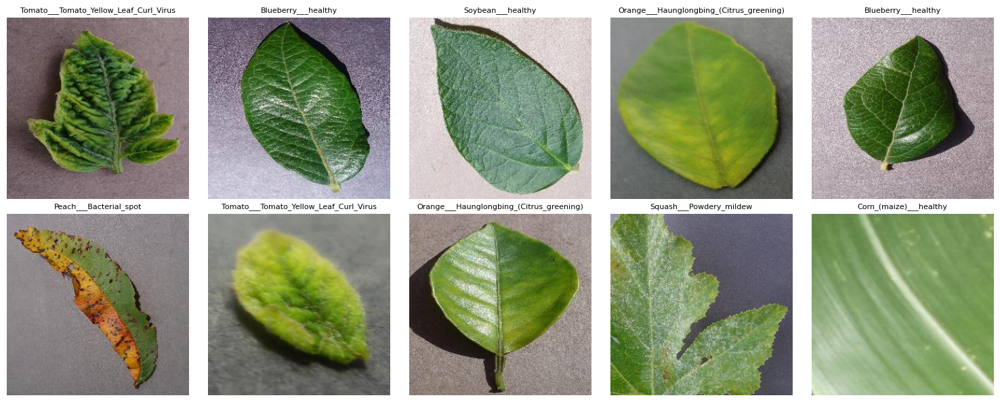

In [14]:
samples_color = df_color.sample(10, random_state=42)
fig, axes = plt.subplots(2, 5, figsize=(15, 6))

for ax, (_, row) in zip(axes.flatten(), samples_color.iterrows()):
    img = Image.open(row['path'])
    ax.imshow(img)
    ax.set_title(row['label'], fontsize=8)
    ax.axis('off')

plt.tight_layout()
plt.show()

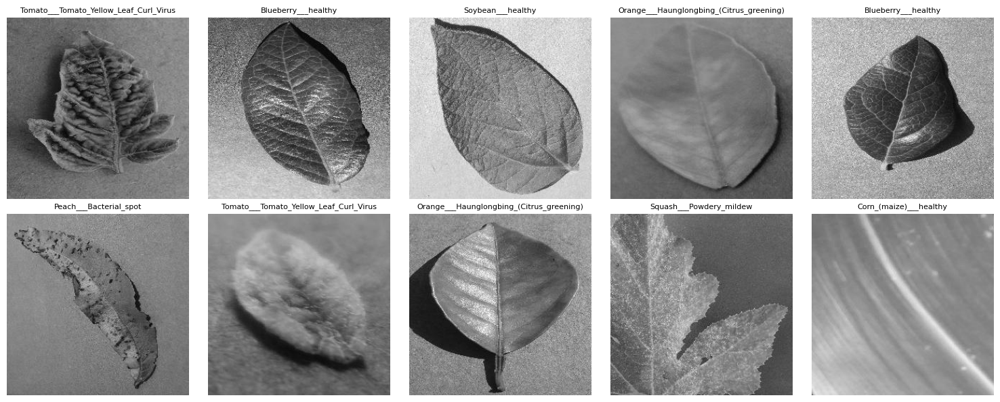

In [15]:
samples_gray = df_gray.sample(10, random_state=42)
fig, axes = plt.subplots(2, 5, figsize=(15, 6))

for ax, (_, row) in zip(axes.flatten(), samples_gray.iterrows()):
    img = Image.open(row['path'])
    ax.imshow(img)
    ax.set_title(row['label'], fontsize=8)
    ax.axis('off')

plt.tight_layout()
plt.show()

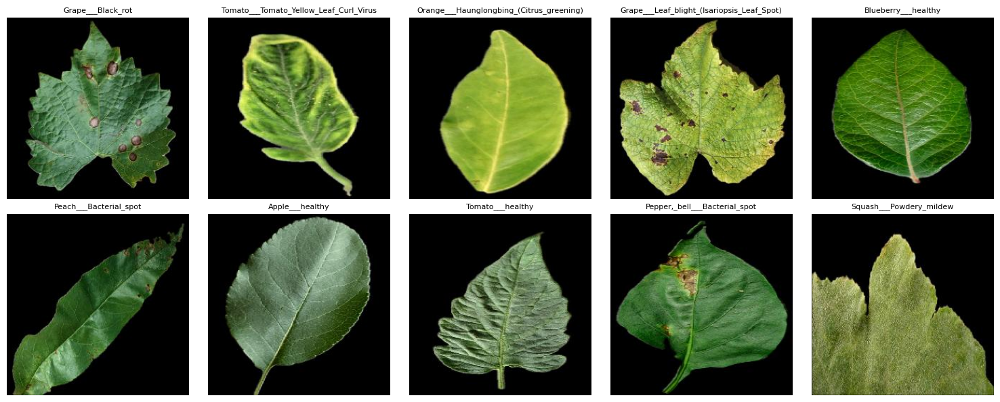

In [16]:
samples_seg = df_seg.sample(10, random_state=42)
fig, axes = plt.subplots(2, 5, figsize=(15, 6))

for ax, (_, row) in zip(axes.flatten(), samples_seg.iterrows()):
    img = Image.open(row['path'])
    ax.imshow(img)
    ax.set_title(row['label'], fontsize=8)
    ax.axis('off')

plt.tight_layout()
plt.show()

Como se pudo observar, en la carpeta color se encuentran las imagenes de las distintas plantas en color. En la carpeta grayscale, estan las mismas imagenes pero en estacala de grises y en la carpeta segmeted, son las mismas pero sin el fondo.

### **Distribución de categorías**

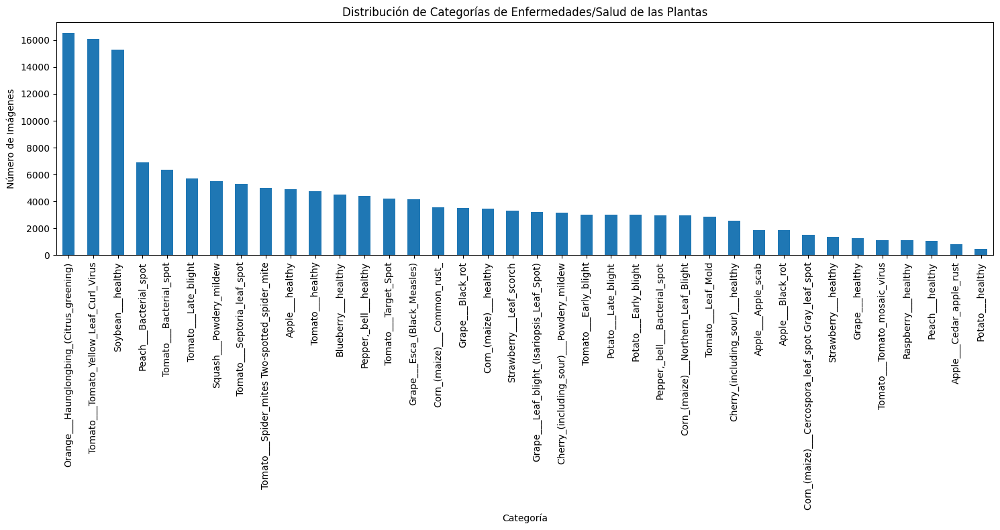

In [17]:
category_counts = df['label'].value_counts()

plt.figure(figsize=(15, 8))
category_counts.plot(kind='bar')
plt.title('Distribución de Categorías de Enfermedades/Salud de las Plantas')
plt.xlabel('Categoría')
plt.ylabel('Número de Imágenes')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

Se puede observar que hay un sesgo hacía las enfermedades con mayor relevancia económica como la infección de cítricos llamada Huanglongbing (HLB) o "Greening" la cual no tiene cura o el "Curl Virus" del tomate. Esta información es importante para evaluar como afecta este desbalance de clases en el entrenamiento del modelo. Como varias enfermedades parecen presentar como síntoma la clorosis (amarillentamiento de la hoja) es sugestivo plantear un gráfico que compare la proporción entre amarillo y verde en cada clase.

Se deberá evaluar la necesidad de aplicar técnicas que permitan mitigar este sesgo como por ejemplo data augmentation sobre clases minoritarias o el uso de pesos por clase en el modelo a entrenar.

### **Distribución del color**

In [18]:
print("Procesando imagenes para extraer proporción de verde y amarillo")

df_seg[['yellow_proportion', 'green_proportion']] = df_seg['path'].apply(lambda x: pd.Series(get_color_proportions(x)))

print("Proporción calculada")
df_seg.head()

Procesando imagenes para extraer proporción de verde y amarillo
Proporción calculada


/tmp/ipython-input-4168683580.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_seg[['yellow_proportion', 'green_proportion']] = df_seg['path'].apply(lambda x: pd.Series(get_color_proportions(x)))
/tmp/ipython-input-4168683580.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_seg[['yellow_proportion', 'green_proportion']] = df_seg['path'].apply(lambda x: pd.Series(get_color_proportions(x)))


,tipo,label,path,yellow_proportion,green_proportion
108610,segmented,Potato___healthy,datos_zip/plantvillage dataset/segmented/Potat...,0.000620,0.843608
108611,segmented,Potato___healthy,datos_zip/plantvillage dataset/segmented/Potat...,0.000246,0.847297
108612,segmented,Potato___healthy,datos_zip/plantvillage dataset/segmented/Potat...,0.000000,0.852324
108613,segmented,Potato___healthy,datos_zip/plantvillage dataset/segmented/Potat...,0.000000,0.892417
108614,segmented,Potato___healthy,datos_zip/plantvillage dataset/segmented/Potat...,0.000000,0.863811


<Figure size 1800x900 with 0 Axes>

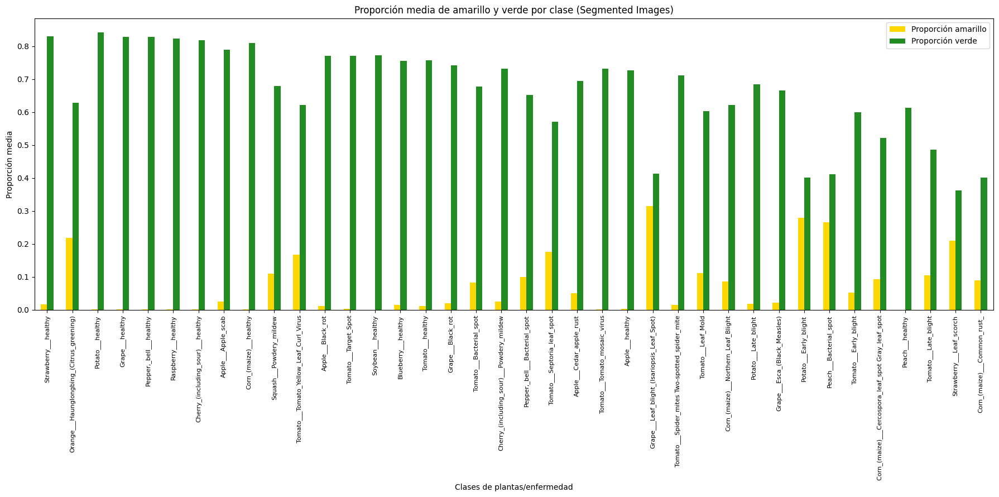

In [19]:
# Agrupamiento por label y cálculo de media por clase
mean_proportions = df_seg.groupby('label')[['yellow_proportion', 'green_proportion']].mean()

# Ordenar por propoción para facilitar la lectura
mean_proportions['total_proportion'] = mean_proportions['yellow_proportion'] + mean_proportions['green_proportion']
mean_proportions = mean_proportions.sort_values(by='total_proportion', ascending=False).drop(columns='total_proportion')

# Crear el gráfico de barras
plt.figure(figsize=(18, 9))
mean_proportions.plot(kind='bar', figsize=(18, 9), color={'yellow_proportion': 'gold', 'green_proportion': 'forestgreen'})
plt.title('Proporción media de amarillo y verde por clase (Segmented Images)')
plt.xlabel('Clases de plantas/enfermedad')
plt.ylabel('Proporción media')
plt.xticks(rotation=90, fontsize=8)
plt.legend(['Proporción amarillo', 'Proporción verde'])
plt.tight_layout()
plt.show()

Se puede apreciar como el el amarillo es caracteristico de algunas enfermedades como "Grape_leaf_blight". Puede ser útil esta información al momento de de elegir con que grupo de imágenes entrenar el modelo (color, segmentadas o escala de grises). En este caso, podríamos concluir en principio, que es importante el uso de imágenes a color ya que la coloración que toma la hoja nos da información sobre la enfermedad que padece.

A continuación, se presentan algunas imágenes de plantas sanas y enfermas junto con sus respectivas distribuciones de color, que permitirán ilustrar las características de color que pueden diferenciar ambos estados.

#### **Visibilizar una muestra**

In [20]:
#Enfermas
df_aux = df_color[df_color['label'] == 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)']
df_aux.reset_index(inplace=True)

image_path_sick = df_aux.iloc[562]['path']
image_label_sick = df_aux.iloc[562]['label']

image_path_sick_stain = df_aux.iloc[973]['path']
image_label_sick_stain = df_aux.iloc[973]['label']

#Sanas
df_aux = df_color[df_color['label'] == 'Grape___healthy']
image_path_healthy = df_aux.iloc[10]['path']
image_label_healthy = df_aux.iloc[10]['label']

Observamos cómo se distribuye el verde y el amarillo en una imagen de muestra con la etiqueta de `Grape___Leaf_blight_(Isariopsis_Leaf_Spot)`. Esta distribucón de color puede ser agregada como feature al modelo.

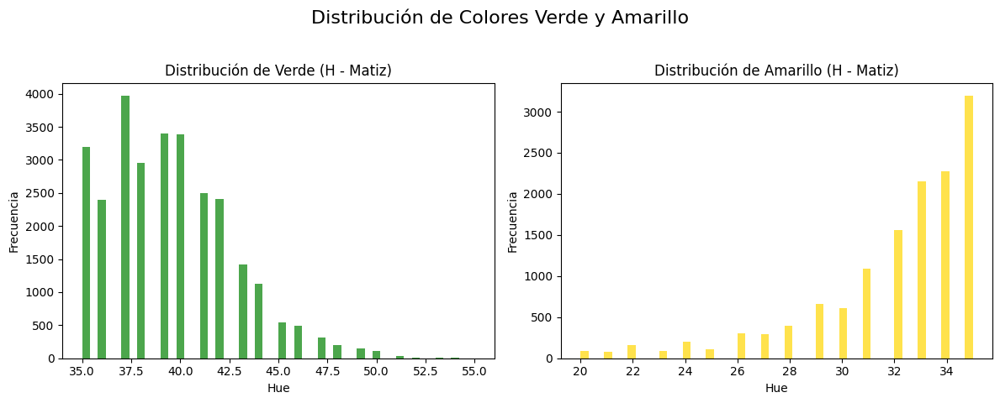

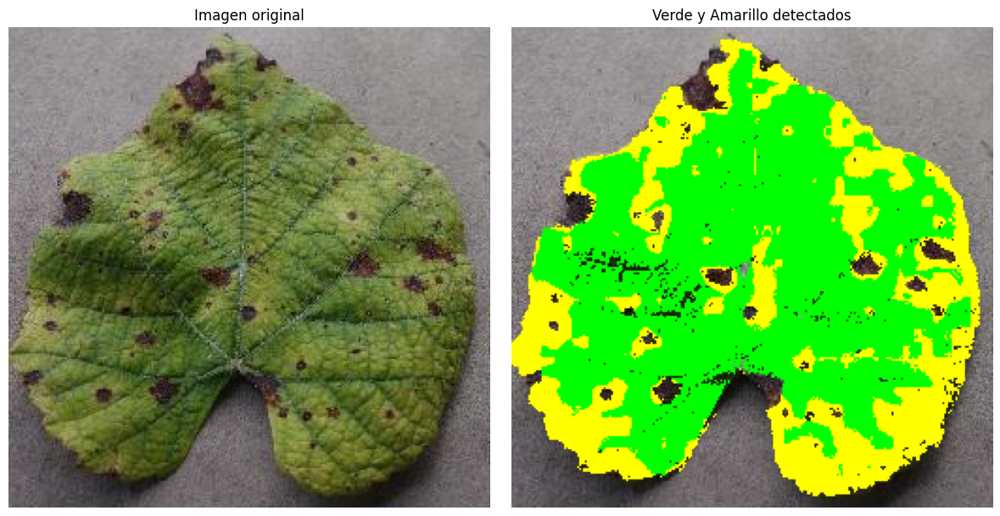

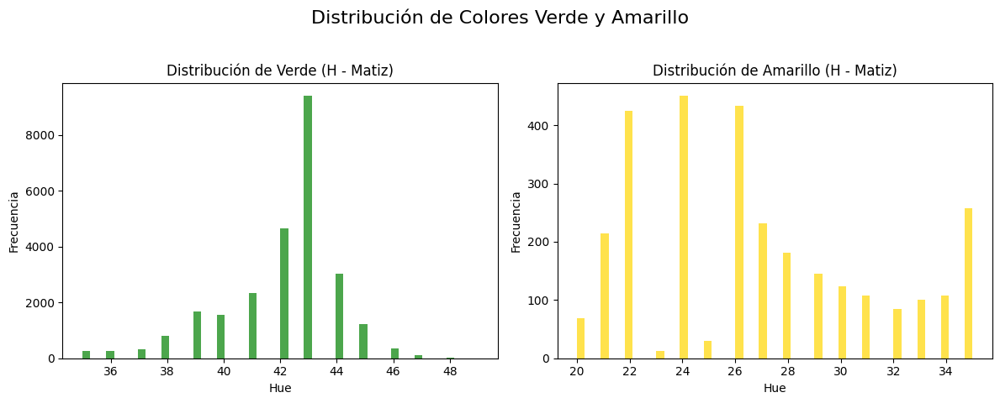

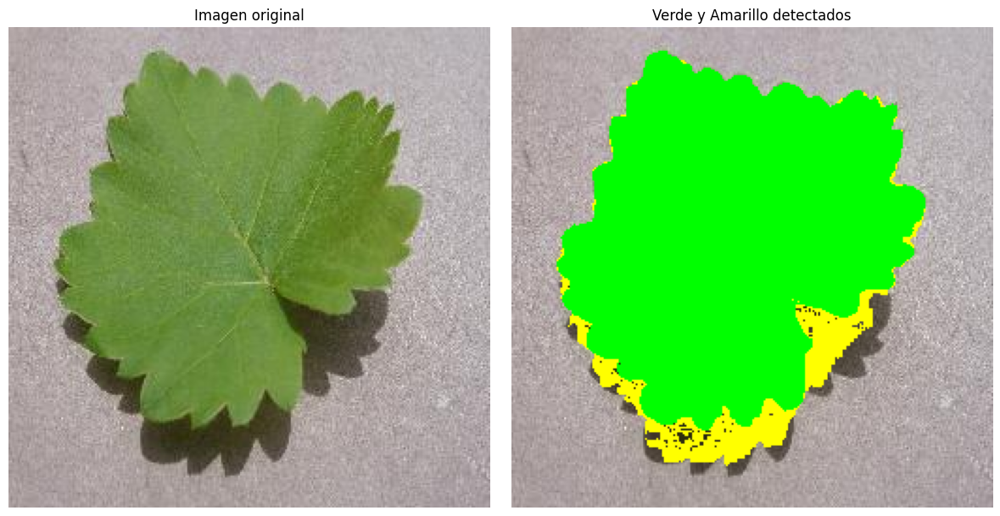

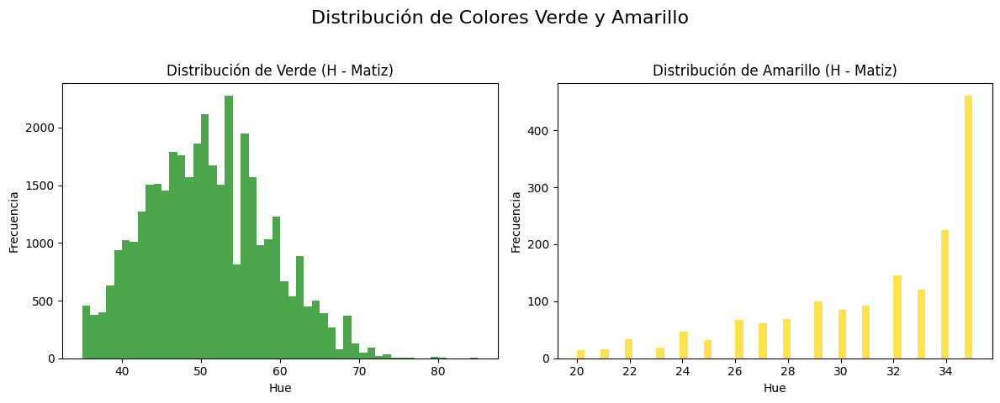

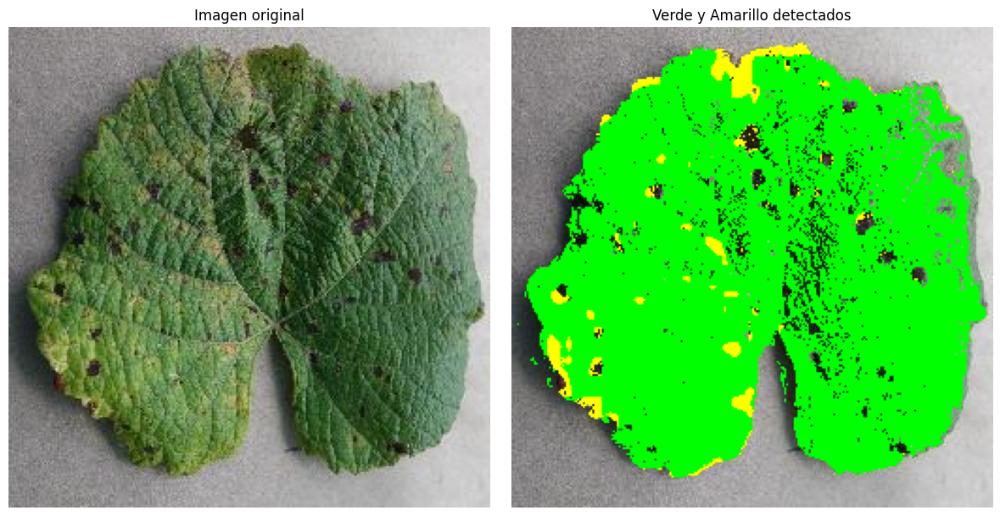

In [21]:
plot_green_yellow_distribution(image_path_sick)
plot_green_yellow_distribution(image_path_healthy)
plot_green_yellow_distribution(image_path_sick_stain)

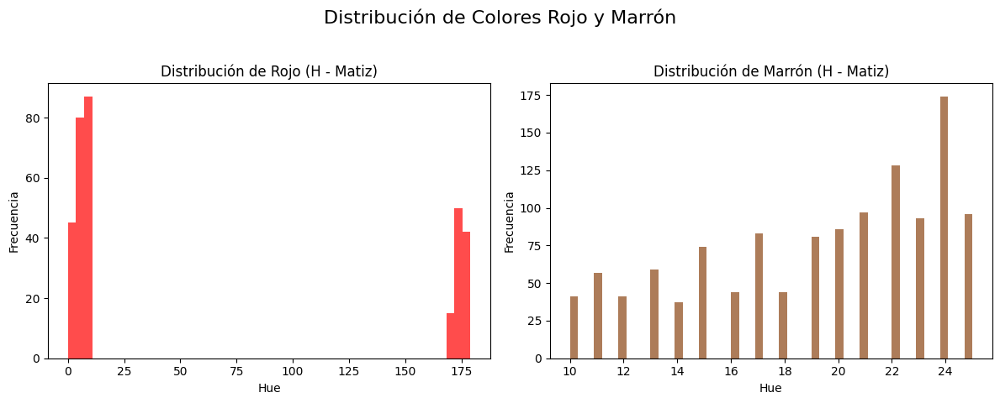

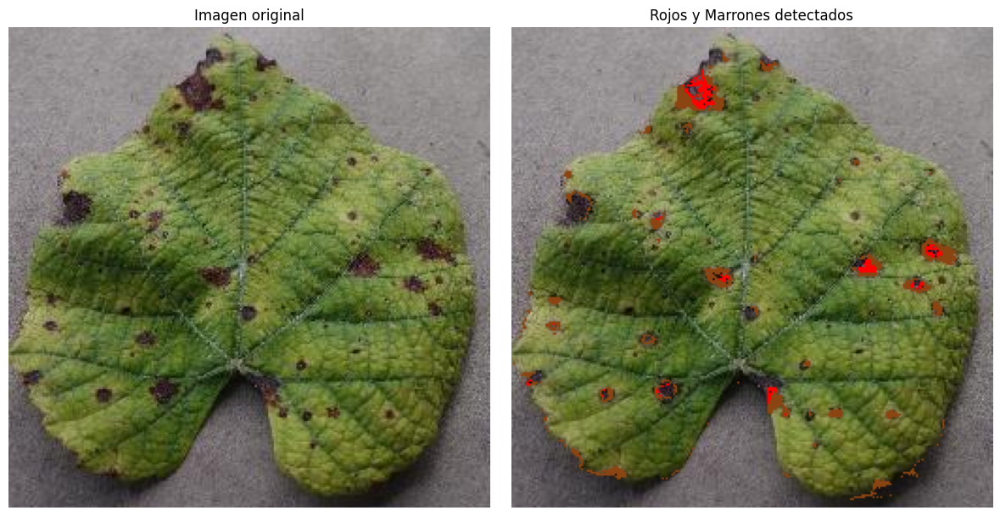

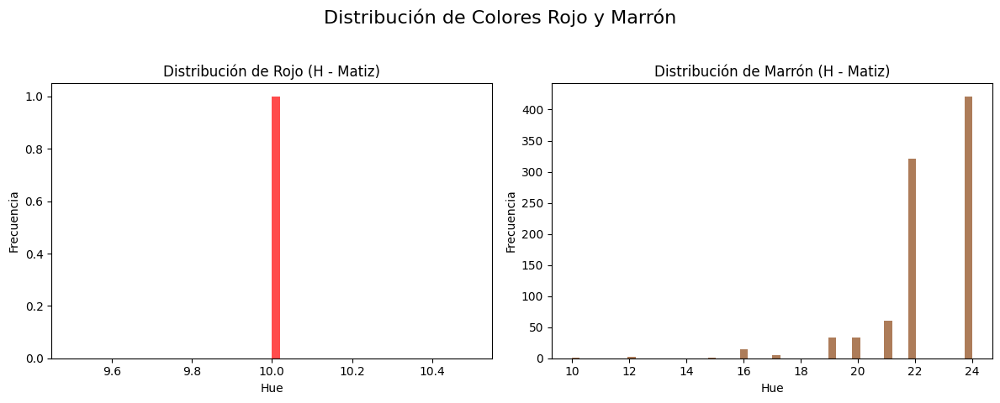

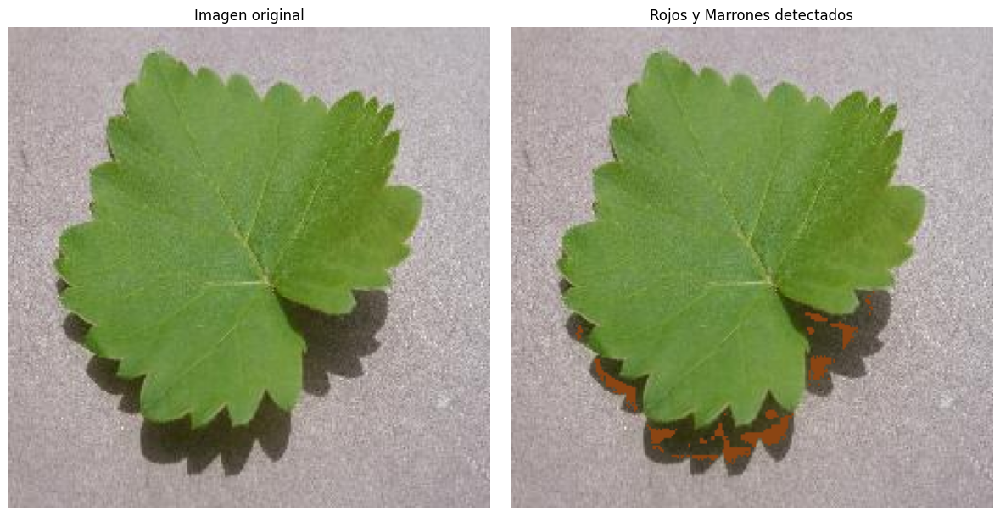

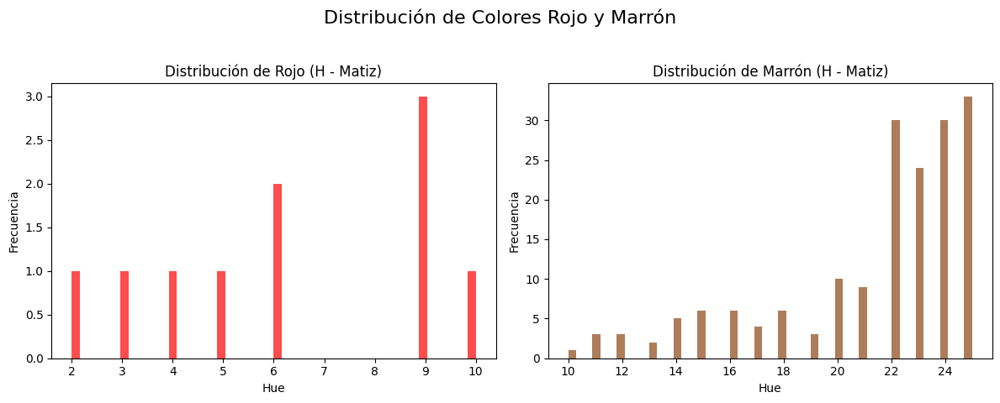

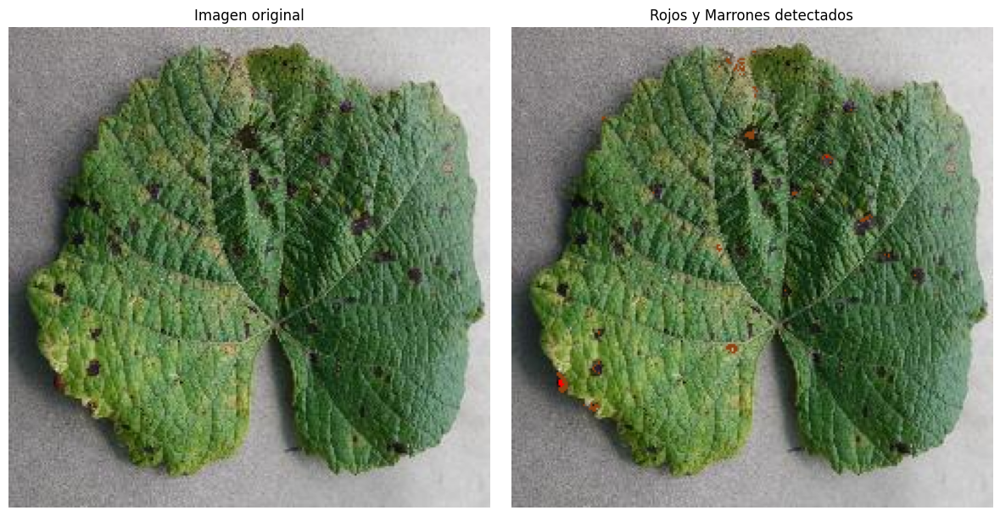

In [22]:
plot_red_brown_distribution(image_path_sick)
plot_red_brown_distribution(image_path_healthy)
plot_red_brown_distribution(image_path_sick_stain)

También de puede agregar la información de distribución RGB para visibilizar la distribución del color cuando hay manchas en las hojas

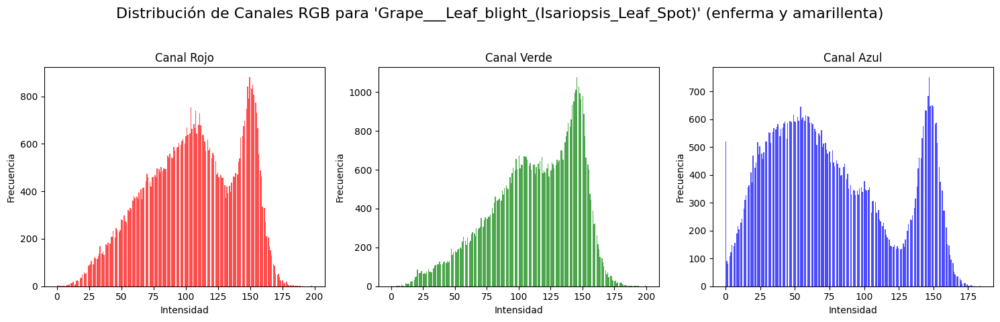

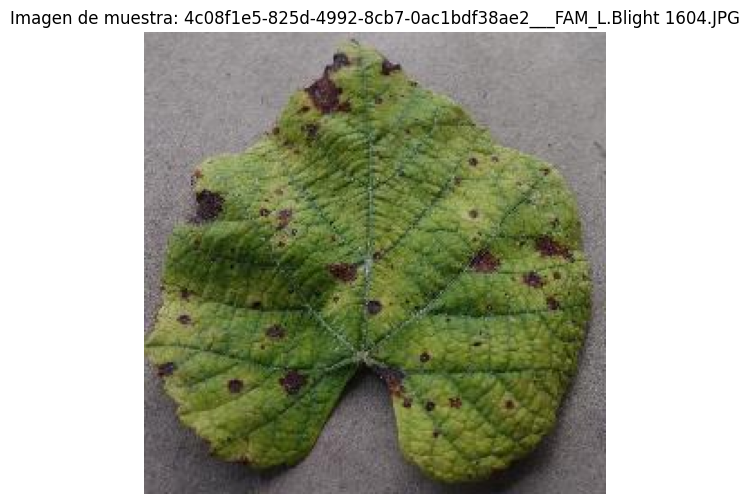

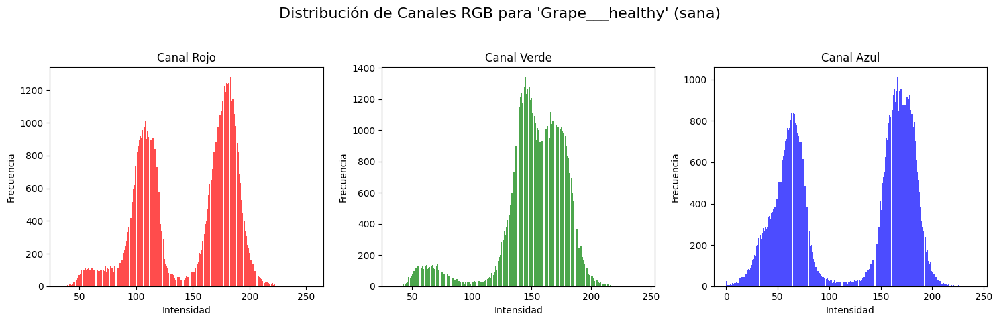

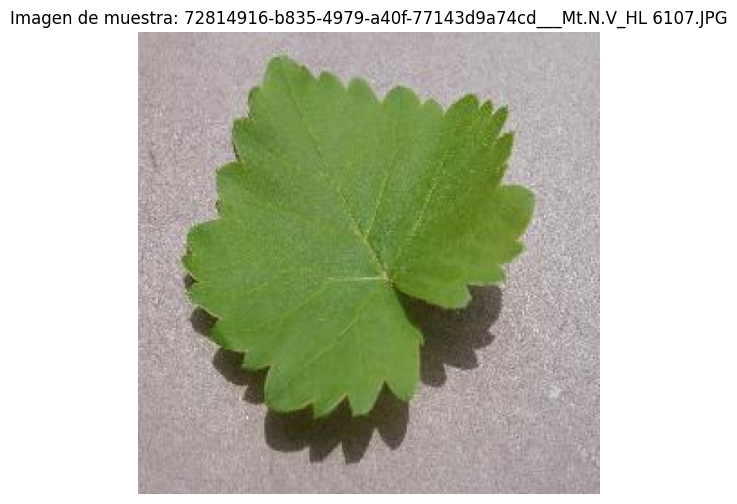

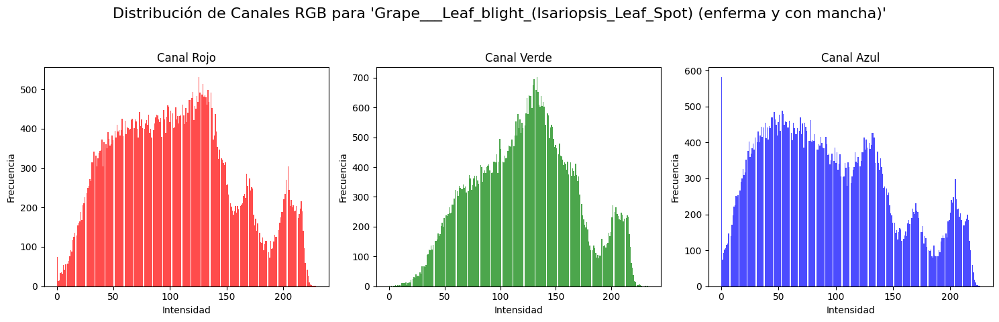

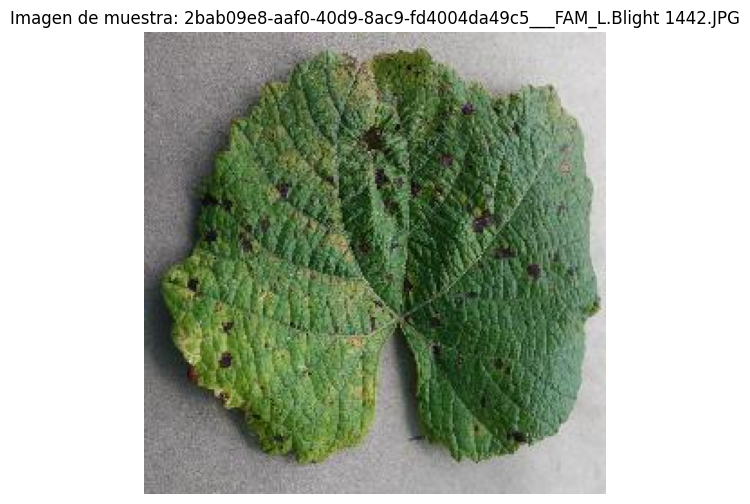

In [23]:
plot_rgb_distribution(image_path_sick, title=f"Distribución de Canales RGB para '{image_label_sick}' (enferma y amarillenta)")
plot_rgb_distribution(image_path_healthy, title=f"Distribución de Canales RGB para '{image_label_healthy}' (sana)")
plot_rgb_distribution(image_path_sick_stain, title=f"Distribución de Canales RGB para '{image_label_sick_stain} (enferma y con mancha)'")

### **Análisis de brillo y saturación**

📊 Estadísticas para 72814916-b835-4979-a40f-77143d9a74cd___Mt.N.V_HL 6107.JPG:
→ Brillo medio: 157.11
→ Contraste (desvío estándar): 31.33
→ Saturación media: 71.12


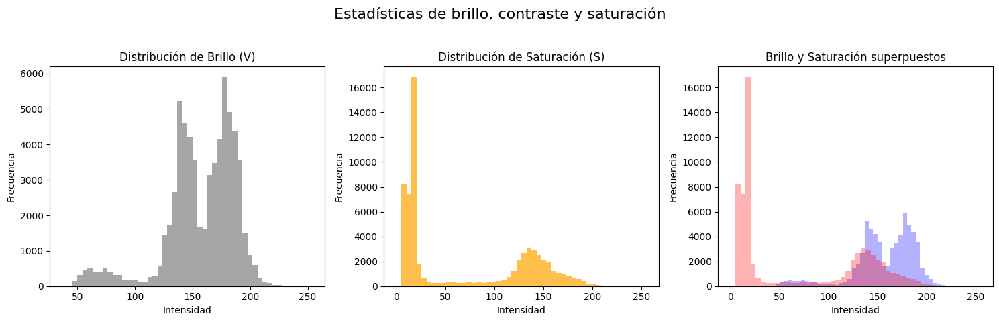

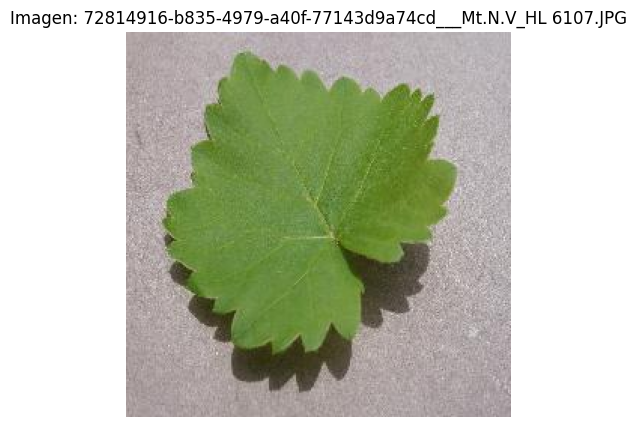

📊 Estadísticas para 452823c1-22d2-4bce-a4cc-8ad014421261___Mt.N.V_HL 6199.JPG:
→ Brillo medio: 176.92
→ Contraste (desvío estándar): 36.68
→ Saturación media: 61.87


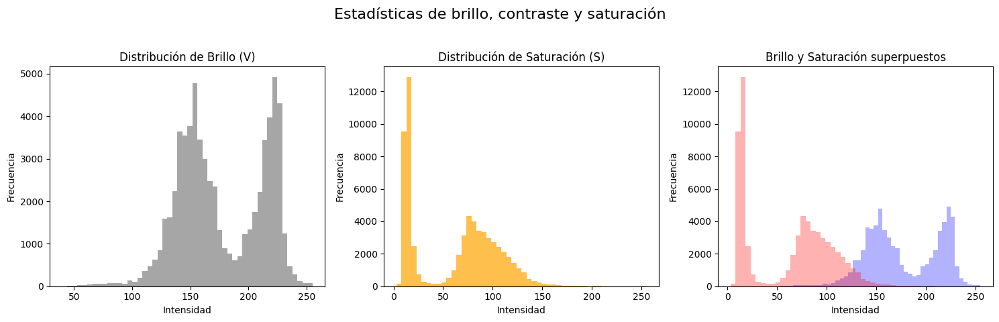

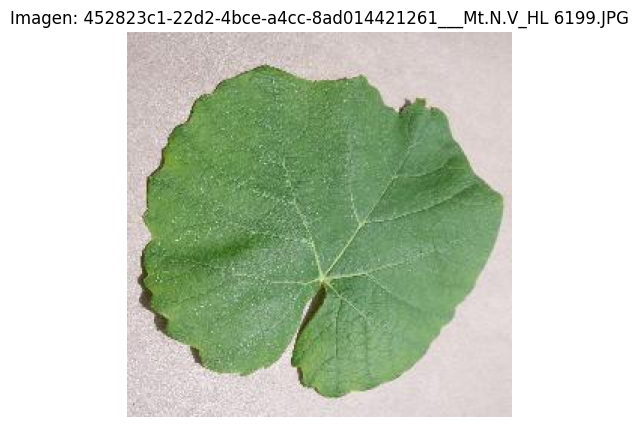

📊 Estadísticas para 4c08f1e5-825d-4992-8cb7-0ac1bdf38ae2___FAM_L.Blight 1604.JPG:
→ Brillo medio: 114.86
→ Contraste (desvío estándar): 33.67
→ Saturación media: 92.61


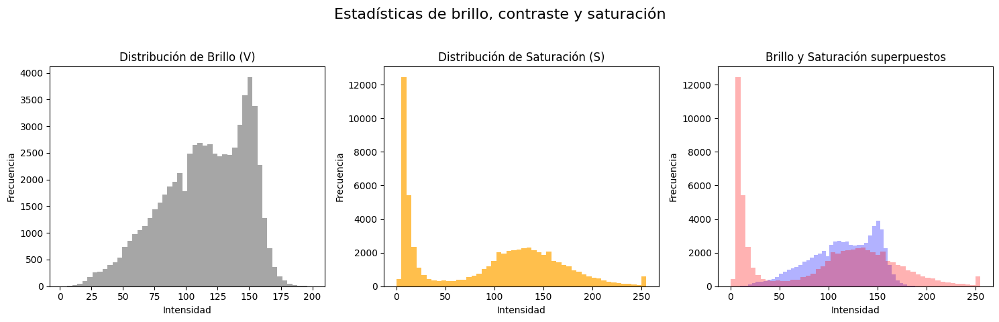

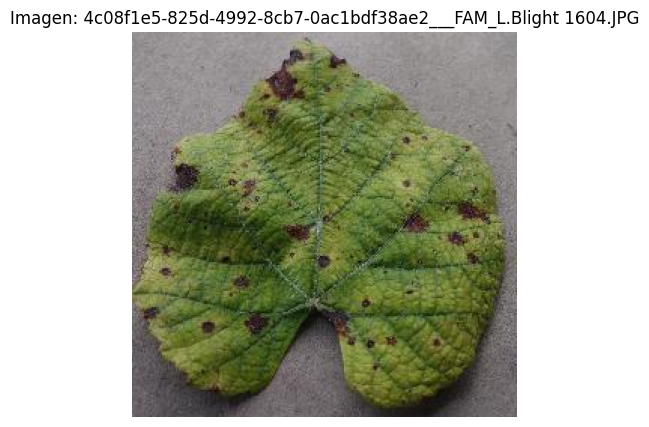

In [24]:
image_path_healthy = df_aux.iloc[10]['path']
image_label_healthy = df_aux.iloc[10]['label']
analyze_image_stats(image_path_healthy)

image_path_healthy = df_aux.iloc[405]['path']
image_label_healthy = df_aux.iloc[405]['label']
analyze_image_stats(image_path_healthy)

analyze_image_stats(image_path_sick)

Existen algunas imágenes de la misma etiqueta que tienen más brillo que otras, esto puede requerir un tratamiento en etapas posteriores, como por ejemplo incorporar transformaciones basadas en *ColorJitter* de Pytorch dentro del pipeline de preprocesamiento. Con esta transformación podríamos generar variaciones controladas de iluminación durante el entrenamiento y así evitar que el modelo asocie incorrectamente la iluminación con la clase objetivo.

### **Análisis de distribuciones**

In [25]:
import seaborn as sns

In [26]:

from tqdm import tqdm
tqdm.pandas()

# 1. Convertimos df_seg en una tabla independiente
df_seg = df_seg.copy()


# Verificamos si ya existen las columnas para no calcular doble
cols_necesarias = ['green_prop', 'mean_r', 'saturation'] # Muestra
if 'green_prop' not in df_seg.columns:
    print("⚠️ Faltan los datos. Iniciando cálculo masivo")

    # A. Proporciones (Verde, Amarillo)
    df_seg[['yellow_prop', 'green_prop']] = df_seg['path'].progress_apply(
        lambda x: pd.Series(get_color_proportions(x))
    )

    # B. Proporciones (Rojo, Marrón)
    df_seg[['red_prop', 'brown_prop']] = df_seg['path'].progress_apply(
        lambda x: pd.Series(get_red_brown_stats(x))
    )

    # C. Estadísticas RGB
    df_seg[['mean_r', 'mean_g', 'mean_b']] = df_seg['path'].progress_apply(
        lambda x: pd.Series(get_rgb_stats(x))
    )

    print("¡Cálculo terminado! Datos guardados en df_seg.")
else:
    print("✅ Los datos ya existen. No es necesario recalcular.")

⚠️ Faltan los datos. Iniciando cálculo masivo


100%|██████████| 54306/54306 [00:49<00:00, 1105.65it/s]

¡Cálculo terminado! Datos guardados en df_seg.


Calculando medias globales...
Cultivos a analizar: ['Potato' 'Corn_(maize)' 'Grape' 'Tomato' 'Raspberry' 'Pepper,_bell'
 'Strawberry' 'Apple' 'Cherry_(including_sour)' 'Squash' 'Soybean'
 'Orange' 'Blueberry' 'Peach']

Generando panel comparativo para: Potato...


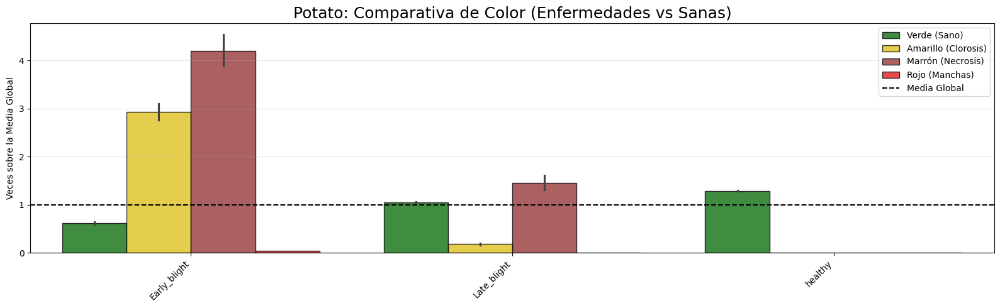


Generando panel comparativo para: Corn_(maize)...


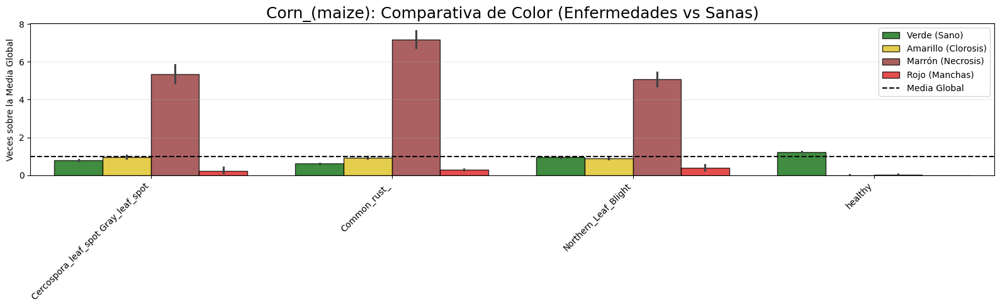


Generando panel comparativo para: Grape...


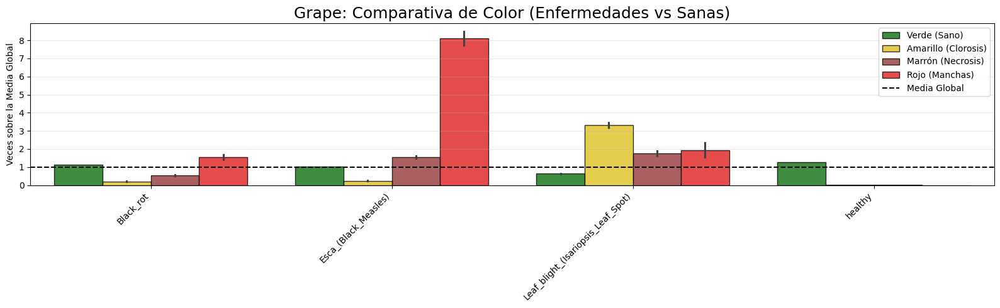


Generando panel comparativo para: Tomato...


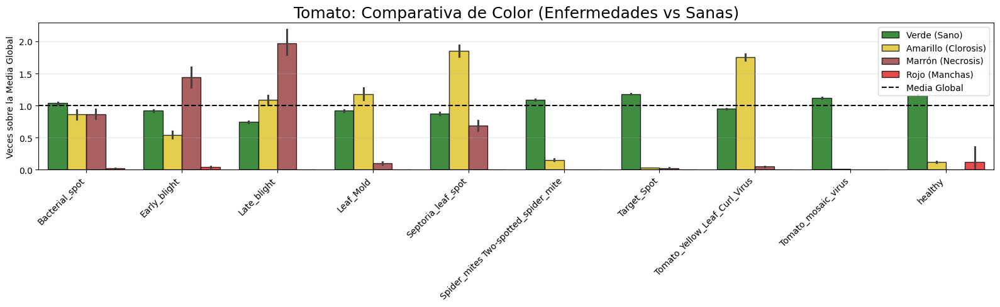


Generando panel comparativo para: Pepper,_bell...


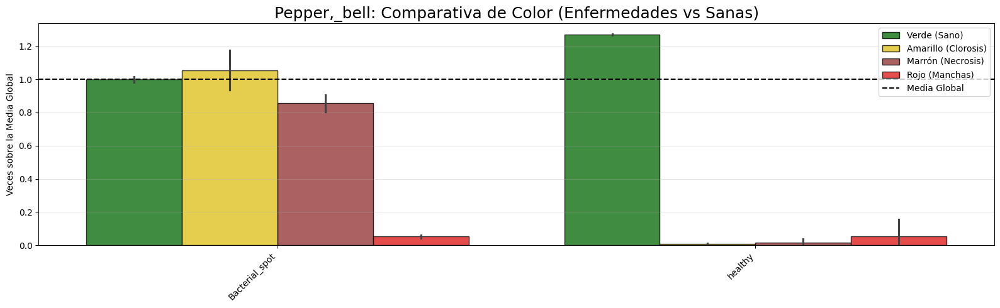


Generando panel comparativo para: Strawberry...


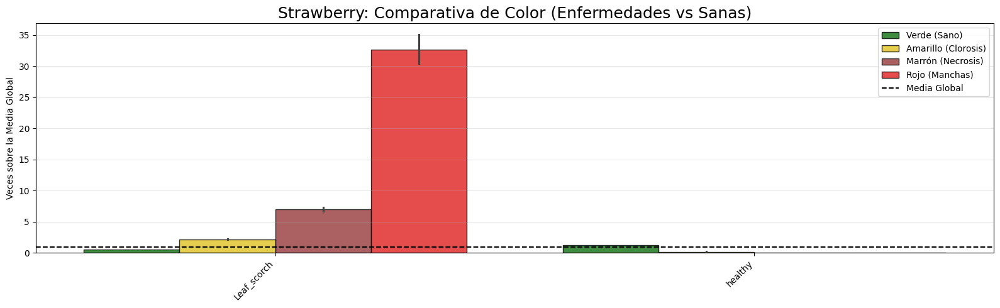


Generando panel comparativo para: Apple...


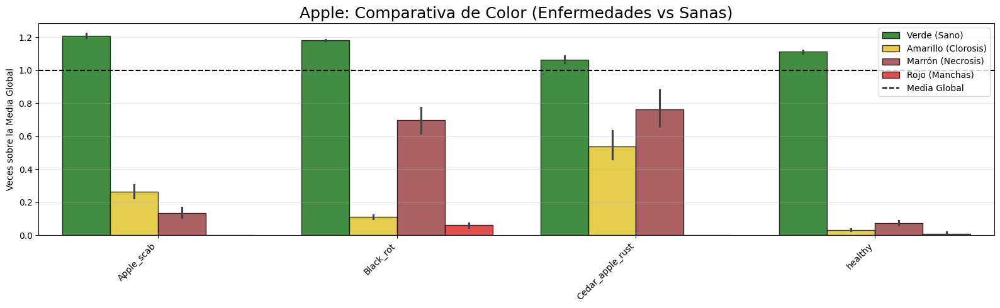


Generando panel comparativo para: Cherry_(including_sour)...


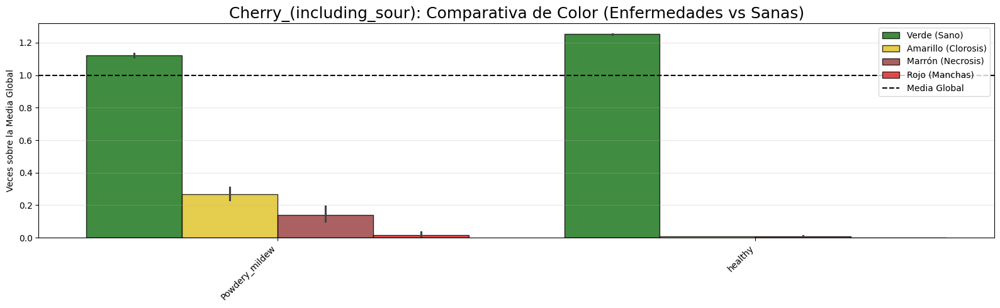


Generando panel comparativo para: Peach...


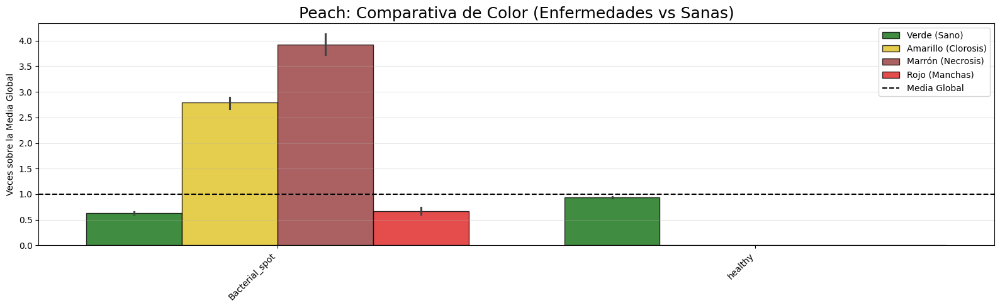

In [28]:

# 1. Configuración de Métricas
metrics_props = ['green_prop', 'yellow_prop', 'brown_prop', 'red_prop']
metrics_rgb = ['mean_r', 'mean_g', 'mean_b']

all_metrics = metrics_props + metrics_rgb


# 2. CREA COLUMNA 'SPECIES' REAL
# Extraemos el texto antes del "___" (Ej: 'Tomato___Target_Spot' -> 'Tomato')
df_seg['species'] = df_seg['label'].apply(lambda x: x.split('___')[0])

# 3. CÁLCULO DE MEDIAS GLOBALES
print("Calculando medias globales...")
global_means = df_seg[all_metrics].mean()

# 4. LISTA DE ESPECIES REALES
unique_species = df_seg['species'].unique()
print(f"Cultivos a analizar: {unique_species}")

# 5. BUCLE POR CULTIVO
for especie in unique_species:
    # Filtramos por la columna 'species' que acabamos de crear
    subset = df_seg[df_seg['species'] == especie].copy()

    # Si la especie tiene una sola clase (ej. solo fotos sanas), saltamos el gráfico comparativo
    if len(subset['label'].unique()) < 2:
        continue

    print(f"\nGenerando panel comparativo para: {especie}...")

    # Crea etiquetas cortas para el Eje X (quitamos el nombre de la especie)
    subset['short_label'] = subset['label'].apply(lambda x: x.split('___')[1] if '___' in x else x)
    subset.sort_values('short_label', inplace=True)

    # Normalizar (Ratio vs Media Global)
    for col in all_metrics:
        media = global_means[col]
        subset[f'{col}_norm'] = subset[col] / media if media > 0 else 0

    # =========================================================================
    # PERFIL DE COLORES (Comparación de Enfermedades)
    # =========================================================================
    df_props = subset.melt(id_vars=['short_label'], value_vars=[c + '_norm' for c in metrics_props], var_name='Métrica', value_name='Ratio')
    df_props['Métrica'] = df_props['Métrica'].map({
        'green_prop_norm': 'Verde (Sano)', 'yellow_prop_norm': 'Amarillo (Clorosis)',
        'brown_prop_norm': 'Marrón (Necrosis)', 'red_prop_norm': 'Rojo (Manchas)'
    })

    plt.figure(figsize=(16, 5))
    sns.barplot(x='short_label', y='Ratio', hue='Métrica', data=df_props,
                palette={'Verde (Sano)': 'green', 'Amarillo (Clorosis)': 'gold', 'Marrón (Necrosis)': 'brown', 'Rojo (Manchas)': 'red'},
                edgecolor='black', alpha=0.8)

    plt.axhline(1.0, color='black', linestyle='--', label='Media Global')
    plt.title(f'{especie}: Comparativa de Color (Enfermedades vs Sanas)', fontsize=18)
    plt.ylabel('Veces sobre la Media Global')
    plt.xlabel('')
    plt.xticks(rotation=45, ha='right')
    plt.legend(loc='upper right')
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

Analizando los gráficos generados para cultivos como tomate, papa, manzana y frutilla, se observa un patrón consistente: la clase "Sana" siempre presenta una barra de color verde notablemente más alta que las enfermedades. Esto confirma que la pérdida de verdor de la hoja es indicador de estrés en la planta, independientemente de la especie.

En cuanto a las enfermedades específicas, los gráficos muestran firmas de color distintivas que permiten diferenciarlas. Por ejemplo, el tizón en la papa dispara los niveles de marrón, indicando necrosis rápida, mientras que enfermedades virales en el tomate elevan el amarillo (clorosis) y en la frutilla aparecen picos de rojo debido a sus lesiones características. Esto valida que el dataset contiene información cromática suficiente para que un modelo pueda clasificar no solo "sano vs. enfermo", sino el tipo específico de patología.


### **Análisis de tamaños de imágenes**

In [29]:
# Calculamos tamaño (ancho, alto) por cada imagen
sizes = []
for path in df['path']:
    try:
        with Image.open(path) as img:
            sizes.append(img.size)
    except:
        sizes.append((None, None))  # Por si alguna imagen falla

df_sizes = df.copy()
df_sizes[['width', 'height']] = pd.DataFrame(sizes, index=df_sizes.index)

# Agrupamos por tipo (color/grayscale/segmented) y resolución
res_by_type = (
    df_sizes
    .groupby(['tipo', 'width', 'height'])
    .size()
    .reset_index(name='count')
    .sort_values(['tipo', 'count'], ascending=[True, False])
)


#Resultados
print("Distribución de resoluciones por tipo de imagen:")
print(res_by_type.head(20))


print("\nNúmero de resoluciones distintas por tipo:")
print(res_by_type.groupby('tipo')['count'].count())



Distribución de resoluciones por tipo de imagen:
        tipo  width  height  count
0      color    256     256  54305
1  grayscale    256     256  54305
2  segmented    256     256  54302
3  segmented    324     512      1
4  segmented    335     512      1
5  segmented    466     512      1
6  segmented    470     512      1

Número de resoluciones distintas por tipo:
tipo
color        1
grayscale    1
segmented    5
Name: count, dtype: int64


La mayoría de las imágenes son del mismo tamaño. La que presenta imagenes de un tamaño diferente es la del tipo segmented, pero son solo 5. El resto tienen todas el mismo tamaño: 256x256

### **Análisis de duplicados**

El análisis se hace calculando un hash MD5 para cada imagen. Si las imágenes son idénticas, ambas tendrán el mismo hash.

Hay 63 grupos de duplicados
Número total de imágenes duplicadas: 126

Hash: 02b1fc2fe6b7501ccb5e1f1031341ce9 - 2 imágenes duplicadas idénticas


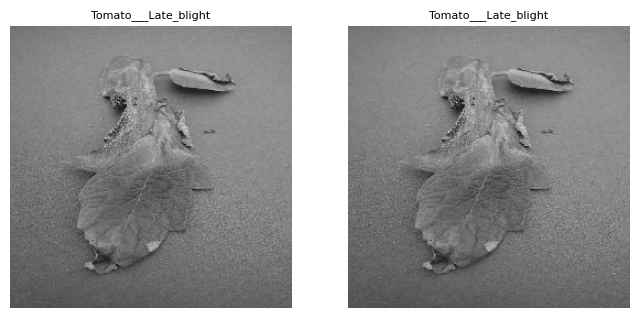


Hash: 0ab46fb1a135f95684c15bf6dbca07c7 - 2 imágenes duplicadas idénticas


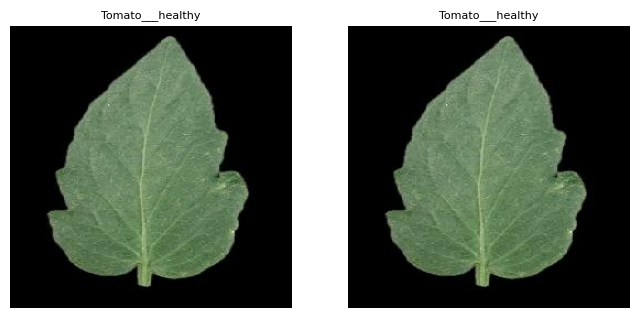


Hash: 0e0dcd876f5b32cac9da836b2e783d91 - 2 imágenes duplicadas idénticas


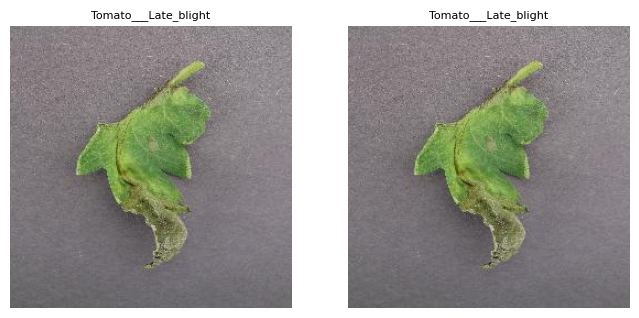

In [30]:
df_hash = df.copy()

# Función para calcular hash de cada imagen
def file_hash(path):
    try:
        with open(path, 'rb') as f:
            return hashlib.md5(f.read()).hexdigest()
    except:
        return None

# Columna temporal de hashes
df_hash['hash'] = df_hash['path'].apply(file_hash)

# Encontramos duplicados exactos
duplicates = df_hash[df_hash.duplicated('hash', keep=False)]

# Contamos grupos y total de imágenes duplicadas
num_grupos = duplicates['hash'].nunique()
num_imagenes_duplicadas = duplicates.shape[0]

print(f"Hay {num_grupos} grupos de duplicados")
print(f"Número total de imágenes duplicadas: {num_imagenes_duplicadas}")

# Agrupos duplicados por hash
duplicates_groups = duplicates.groupby('hash')

# Mostramos 3 grupos de duplicados
for i, (h, group) in enumerate(duplicates.groupby('hash')):
    if i >= 3:
        break

    group_to_show = group.head(2)
    m = len(group_to_show)

    print(f"\nHash: {h} - {m} imágenes duplicadas idénticas")

    fig, axes = plt.subplots(1, m, figsize=(4 * m, 4))
    if m == 1:
        axes = [axes]

    for ax, (_, row) in zip(axes, group_to_show.iterrows()):
        img = Image.open(row['path'])
        ax.imshow(img)
        ax.set_title(f"{row['label']}", fontsize=8)
        ax.axis('off')

    plt.show()


Existen 63 grupos de imágenes duplicadas.